# Visualization of the results

This notebook visualizes the results and plots samples of reconstructed pointclouds.


In [16]:
import torch
import numpy as np 

import pyvista as pv 
pv.set_jupyter_backend("static")

In [17]:
# Constants for the model. 
base_folder = "./results/vae_airplane" 

# Visualize comparison PVD, Ours, Training samples

In [18]:
# Load all samples. 
pvd_airplane = torch.load("./results/pvd/airplane/samples.pth")
ours_airplane = torch.load("./results/vae_airplane_latent/samples.pt")
train_airplane = torch.load("./results/references/airplane_train_pts.pt").view(-1,2048,3)
s = torch.load("./results/references/airplane_train_pts_std.pt").unsqueeze(1)
m = torch.load("./results/references/airplane_train_pts_means.pt").unsqueeze(1)
print(s.shape)
print(m.shape)
# Pass the vae through the train
train_airplane = train_airplane * s + m


torch.Size([5664, 1, 1])
torch.Size([5664, 1, 3])


In [19]:
train_airplane.shape[0] / 2

2832.0

# Point voxel diffusion vs ours

Visual comparison of one of our models and PVD for the first 10 samples. 
Based on this it _looks_ like mode collapse could be an issue. 
Top row is PVD, middle row is ours and bottom row are training samples. 

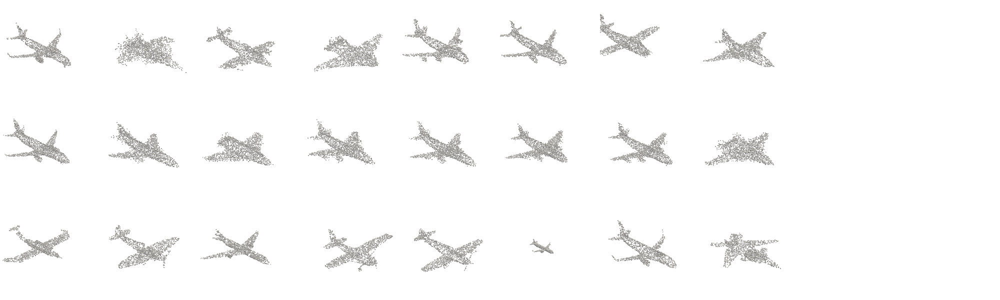

In [20]:

pl = pv.Plotter(
        shape=(3, 10),
        window_size=[2000, 600],
        border=False,
        polygon_smoothing=True,
    )

for col in range(8):
    # First PVD
    pl.subplot(0, col)
    actor = pl.add_points(
        pvd_airplane[col].cpu().numpy().reshape(-1, 3),
        style="points",
        emissive=False,
        show_scalar_bar=False,
        render_points_as_spheres=True,
        color="lightgray",
        point_size=2,
        ambient=0.2,
        diffuse=0.8,
        specular=0.8,
        specular_power=40,
        smooth_shading=True,
    )
    # Ours
    pl.subplot(1, col)
    actor = pl.add_points(
        ours_airplane[col].cpu().numpy().reshape(-1, 3),
        style="points",
        emissive=False,
        show_scalar_bar=False,
        render_points_as_spheres=True,
        color="lightgray",
        point_size=2,
        ambient=0.2,
        diffuse=0.8,
        specular=0.8,
        specular_power=40,
        smooth_shading=True,
    )
    pl.subplot(2, col)
    actor = pl.add_points(
        train_airplane[2*col].cpu().numpy().reshape(-1, 3),
        style="points",
        emissive=False,
        show_scalar_bar=False,
        render_points_as_spheres=True,
        color="lightgray",
        point_size=2,
        ambient=0.2,
        diffuse=0.8,
        specular=0.8,
        specular_power=40,
        smooth_shading=True,
    )
        

pl.background_color = "w"
pl.link_views()
pl.camera_position = "xy"
pos = pl.camera.position
pl.camera.position = (pos[0], pos[1] + 3, pos[2])
pl.camera.position = (5, 0, 0)
pl.camera.azimuth = 45
pl.camera.elevation = 30
# create a top down light
light = pv.Light(
    position=(0, 0, 0), positional=True, cone_angle=50, exponent=20, intensity=0.2
)
pl.add_light(light)
pl.camera.zoom(3.)
pl.show()


# Grid of pure PVD

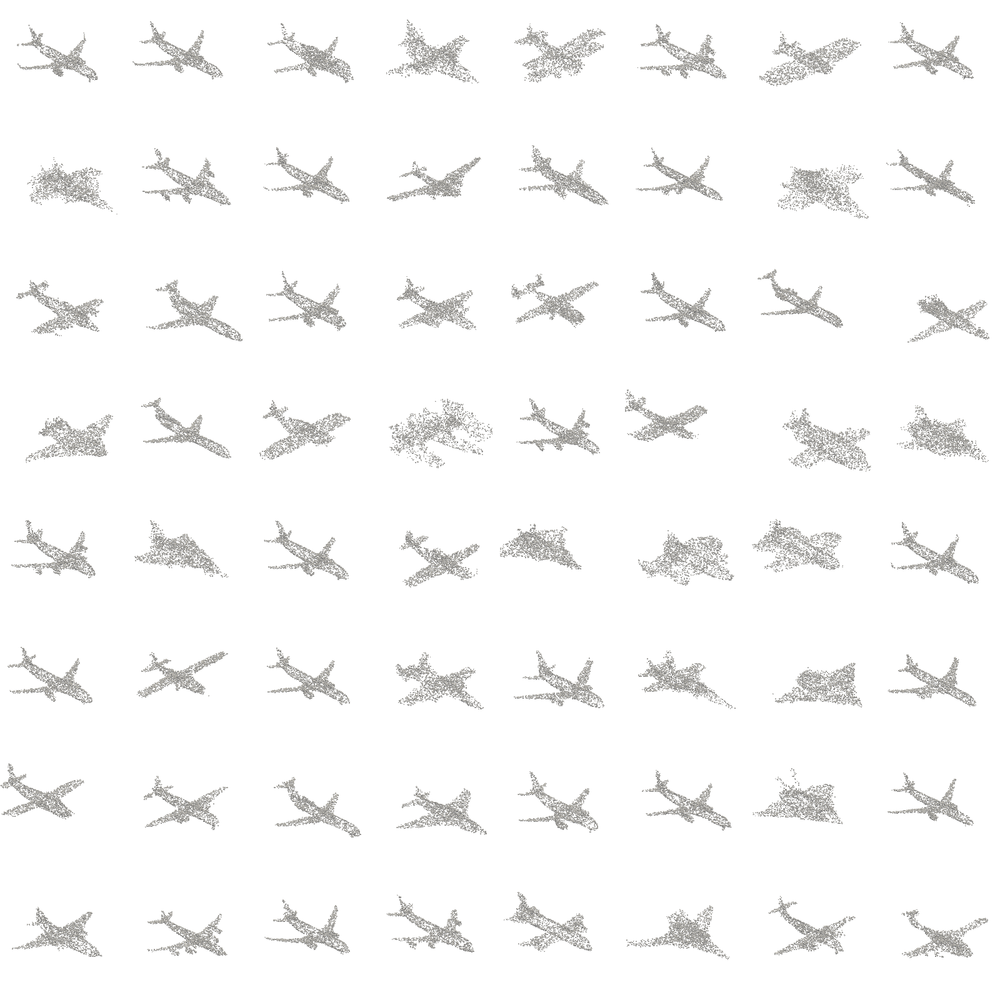

In [21]:

pl = pv.Plotter(
        shape=(8, 8),
        window_size=[1600, 1600],
        border=False,
        polygon_smoothing=True,
    )

for col in range(8):
    for row in range(8):
        # First plat
        pl.subplot(row, col)
        actor = pl.add_points(
            pvd_airplane[col * 8 + row].cpu().numpy().reshape(-1, 3),
            style="points",
            emissive=False,
            show_scalar_bar=False,
            render_points_as_spheres=True,
            color="lightgray",
            point_size=2,
            ambient=0.2,
            diffuse=0.8,
            specular=0.8,
            specular_power=40,
            smooth_shading=True,
        )
        
pl.background_color = "w"
pl.link_views()
pl.camera_position = "xy"
pos = pl.camera.position
pl.camera.position = (pos[0], pos[1] + 3, pos[2])
pl.camera.position = (5, 0, 0)
pl.camera.azimuth = 45
pl.camera.elevation = 30
# create a top down light
light = pv.Light(
    position=(0, 0, 0), positional=True, cone_angle=50, exponent=20, intensity=0.2
)
pl.add_light(light)
pl.camera.zoom(3.)
pl.show()


# Grid of ours 

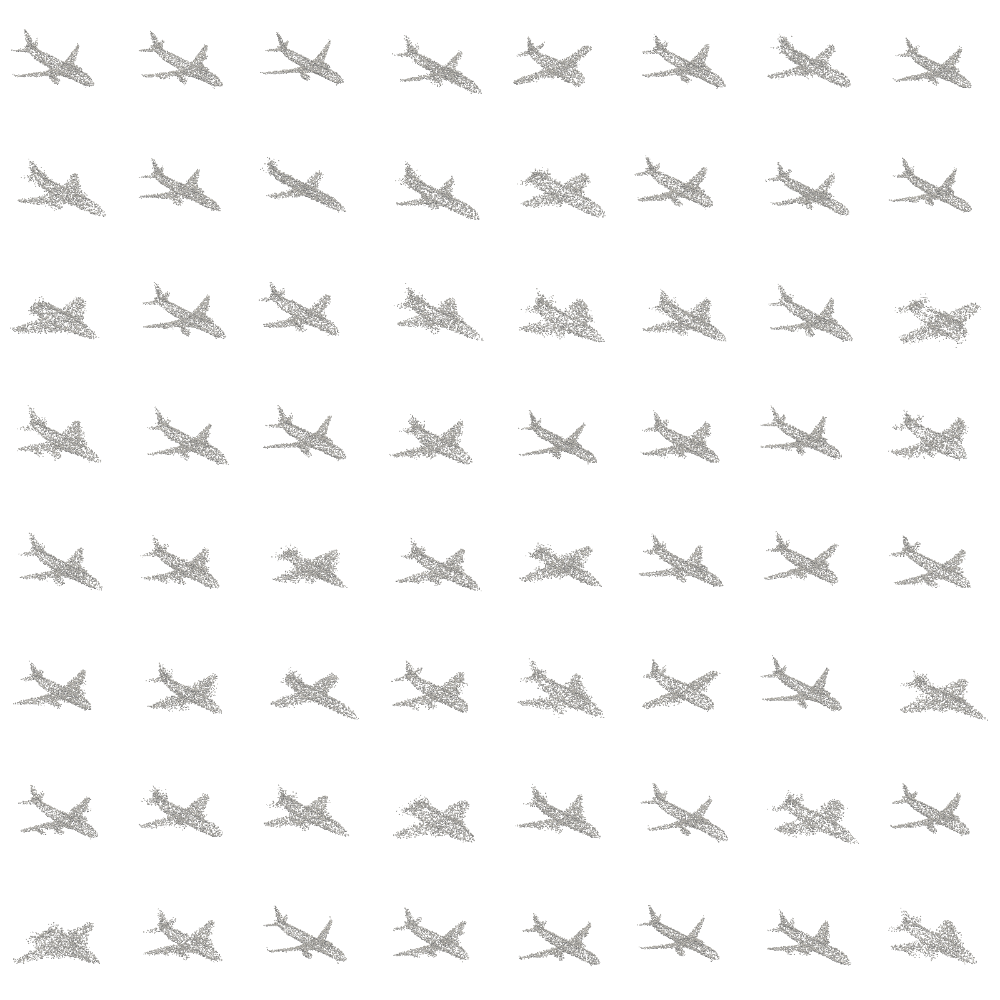

In [22]:
pl = pv.Plotter(
        shape=(8, 8),
        window_size=[1600, 1600],
        border=False,
        polygon_smoothing=True,
    )

for col in range(8):
    for row in range(8):
        # First plat
        pl.subplot(row, col)
        actor = pl.add_points(
            ours_airplane[col * 8 + row].cpu().numpy().reshape(-1, 3),
            style="points",
            emissive=False,
            show_scalar_bar=False,
            render_points_as_spheres=True,
            color="lightgray",
            point_size=2,
            ambient=0.2,
            diffuse=0.8,
            specular=0.8,
            specular_power=40,
            smooth_shading=True,
        )
        
pl.background_color = "w"
pl.link_views()
pl.camera_position = "xy"
pos = pl.camera.position
pl.camera.position = (pos[0], pos[1] + 3, pos[2])
pl.camera.position = (5, 0, 0)
pl.camera.azimuth = 45
pl.camera.elevation = 30
# create a top down light
light = pv.Light(
    position=(0, 0, 0), positional=True, cone_angle=50, exponent=20, intensity=0.2
)
pl.add_light(light)
pl.camera.zoom(3.)
pl.show()


# Grid of training data

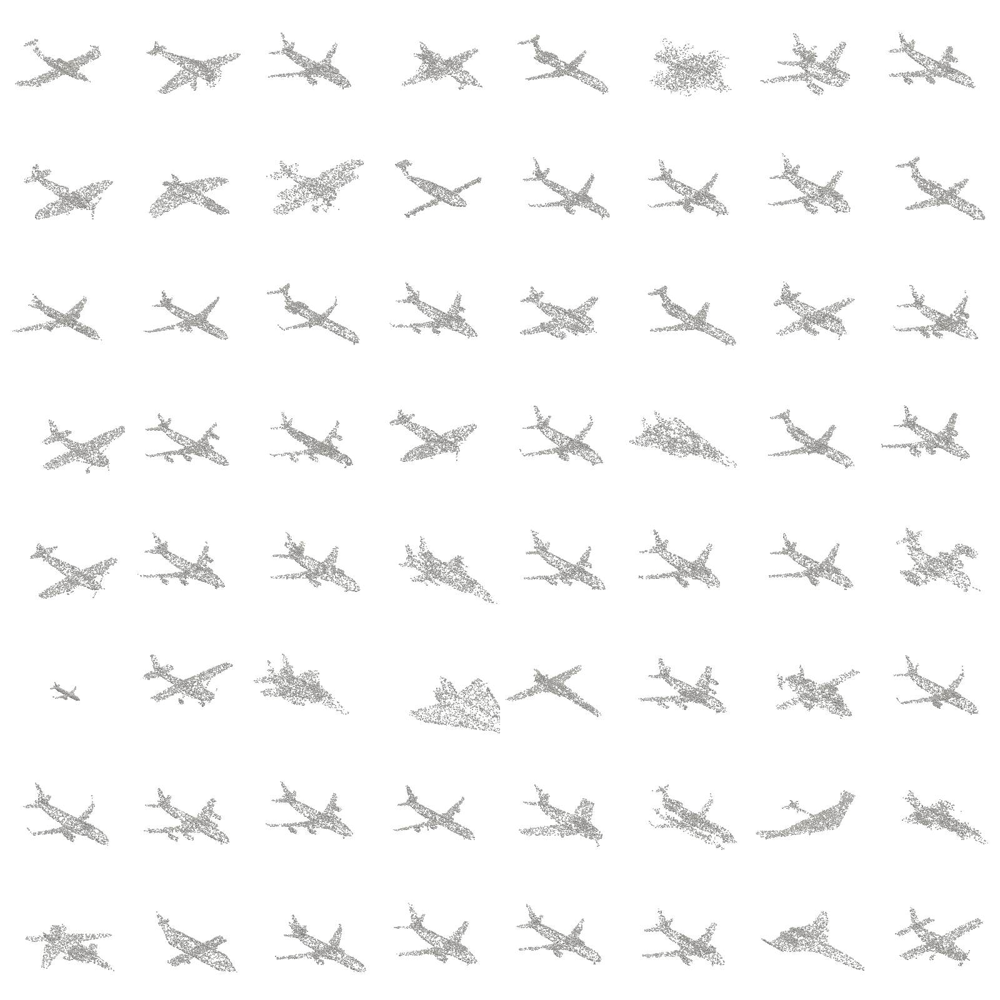

In [23]:
pl = pv.Plotter(
        shape=(8, 8),
        window_size=[1600, 1600],
        border=False,
        polygon_smoothing=True,
    )

for col in range(8):
    for row in range(8):
        # First plat
        pl.subplot(row, col)
        actor = pl.add_points(
            train_airplane[2*(col * 8 + row)].cpu().numpy().reshape(-1, 3),
            style="points",
            emissive=False,
            show_scalar_bar=False,
            render_points_as_spheres=True,
            color="lightgray",
            point_size=2,
            ambient=0.2,
            diffuse=0.8,
            specular=0.8,
            specular_power=40,
            smooth_shading=True,
        )
        
pl.background_color = "w"
pl.link_views()
pl.camera_position = "xy"
pos = pl.camera.position
pl.camera.position = (pos[0], pos[1] + 3, pos[2])
pl.camera.position = (5, 0, 0)
pl.camera.azimuth = 45
pl.camera.elevation = 30
# create a top down light
light = pv.Light(
    position=(0, 0, 0), positional=True, cone_angle=50, exponent=20, intensity=0.2
)
pl.add_light(light)
pl.camera.zoom(3.)
pl.show()


# Comparison of the ECTs.

## Generated ECTs

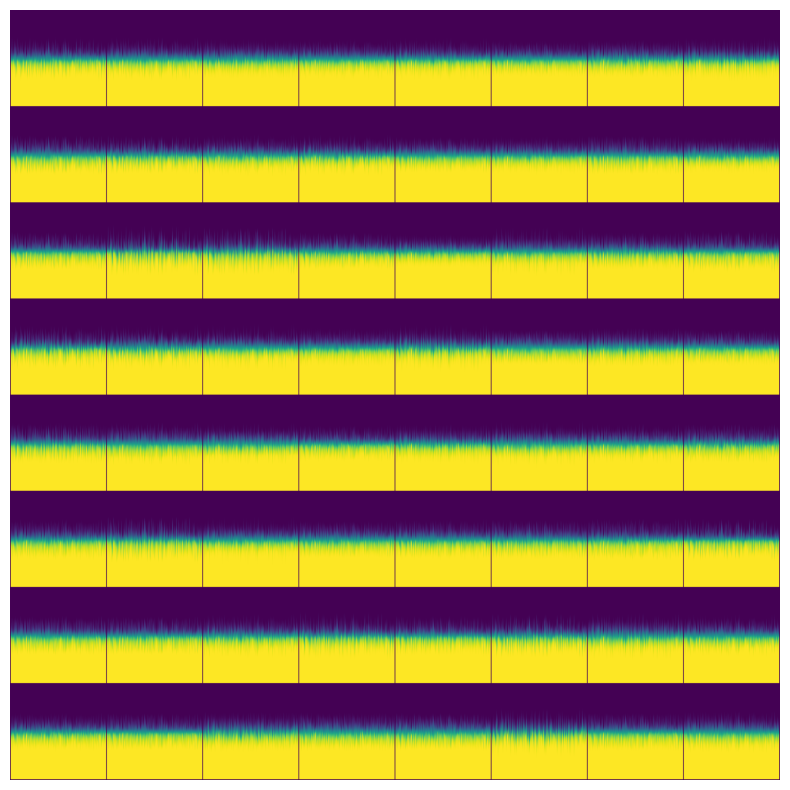

In [24]:

from matplotlib import axis
import matplotlib.pyplot as plt
from numpy import gradient
import torchvision

ects = torch.load("./results/vae_airplane_latent/sample_ect.pt")[:64].unsqueeze(1).repeat(1,3,1,1).cpu()
grid_img = torchvision.utils.make_grid(ects, nrow=8)[0]

fig = plt.figure(figsize=(10,10))
plt.imshow(grid_img.numpy(),cmap='viridis')
plt.axis("off")
plt.show()

## True ECTs

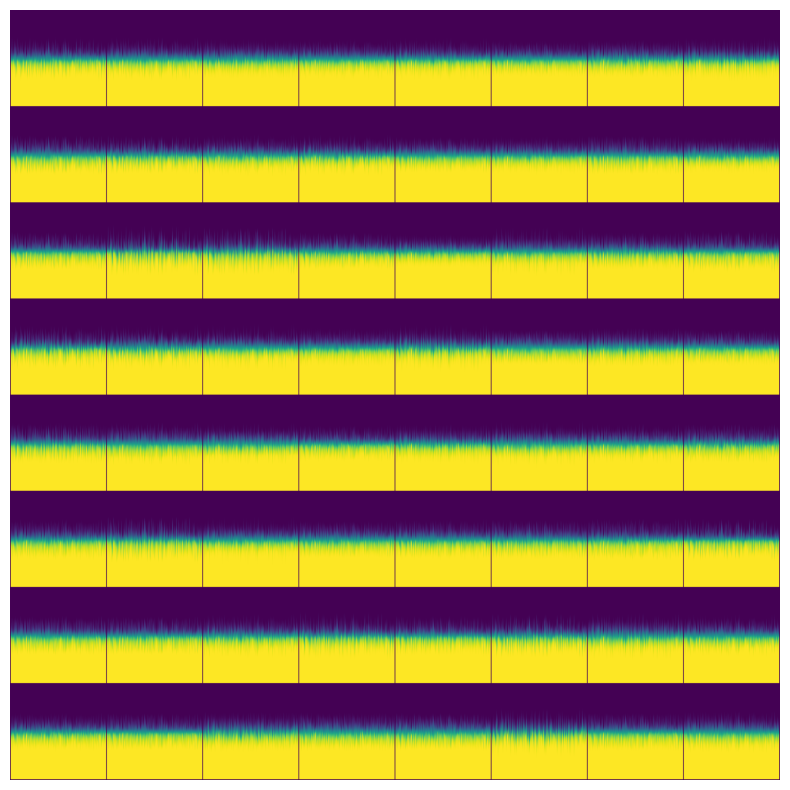

In [25]:
import matplotlib.pyplot as plt
import torchvision

reference_ects = torch.load("./results/vae_airplane_latent/ect.pt")[:64].unsqueeze(1).repeat(1,3,1,1).cpu()
grid_img = torchvision.utils.make_grid(ects, nrow=8)[0]

fig = plt.figure(figsize=(10,10))
plt.imshow(grid_img.numpy(),cmap='viridis')
plt.axis("off")
plt.show()

## Comparison side by side.

Top row is a true ect and the bottom is a generated ect.

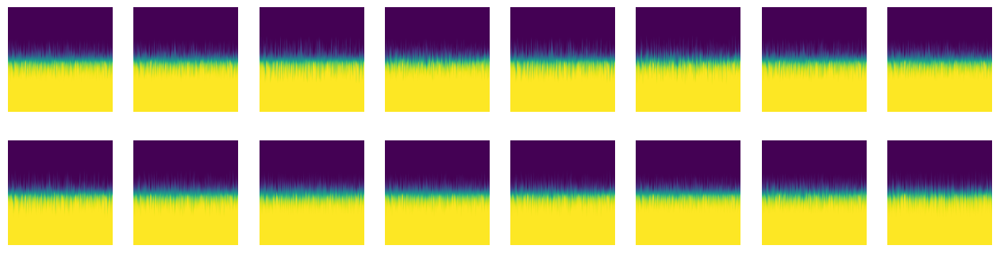

In [26]:
fig,axes = plt.subplots(nrows=2,ncols=8,figsize=(16,4))
reference_ects = torch.load("./results/vae_airplane_latent/ect.pt")[:64].cpu()
ects = torch.load("./results/vae_airplane_latent/sample_ect.pt")[:64].cpu()

for ref_ect, gen_ect, ax in zip(reference_ects, ects,axes.T):
    ax[0].imshow(ref_ect.squeeze().cpu())
    ax[0].axis("off")
    ax[1].imshow(gen_ect.squeeze().cpu())
    ax[1].axis("off")

## Close-up comparison.

Note that the VAE produces images that mimick the true ect well, so it has learned proper structure of an ect. 
This makes it _look_ like the ects are similar but they are in fact not (I did check this).
It is also nice to see that there is no blurryness between the ect fibers (columns) and this shows it to be able to learn 
the structure well.


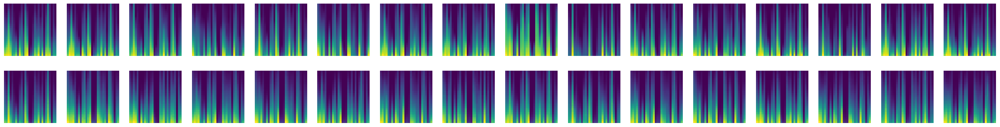

In [27]:
fig,axes = plt.subplots(nrows=2,ncols=16,figsize=(32,4))

start = (90,28)
window_size = (28,28) 

for ref_ect, gen_ect, ax in zip(reference_ects, ects,axes.T):
    ax[0].imshow(ref_ect[start[0]:start[0]+window_size[0],start[1]:start[1]+window_size[1]].squeeze().cpu())
    ax[0].axis("off")
    ax[1].imshow(gen_ect[start[0]:start[0]+window_size[0],start[1]:start[1]+window_size[1]].squeeze().cpu())
    ax[1].axis("off")

# Overlay of Encoder reconstruction with the ground truth point clouds.

The top row is the reconstructed point cloud, the bottom row is the ground truth.
The middle row show the overlay. Figure shows the first $16$ point clouds. 

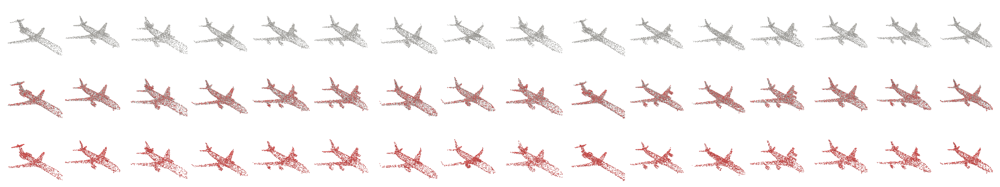

In [28]:
from shapesynthesis.plotting import plot_recon_3d

reconstructed_pc = torch.load("./results/encoder_airplane/reconstructions.pt")
ground_truth_pc = torch.load("./results/encoder_airplane/references.pt")

plot_recon_3d(reconstructed_pc.cpu().numpy() * 10,ground_truth_pc.cpu().numpy() * 10,num_pc=16,offset=0)

Now we show the $10$ worst cases.

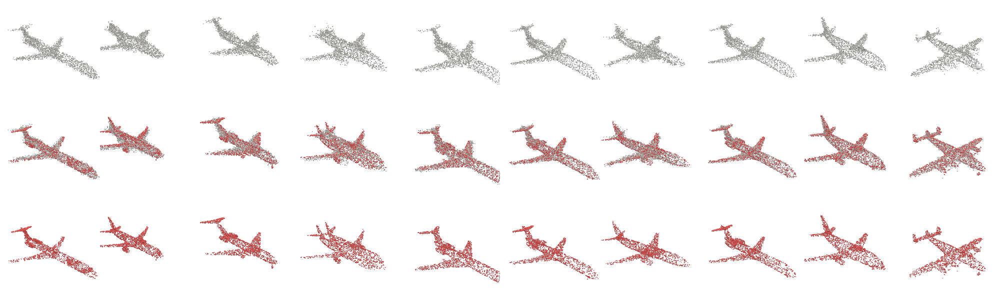

In [29]:
from shapesynthesis.metrics.evaluation import EMD_CD

result = EMD_CD(reconstructed_pc.cuda(),ground_truth_pc.cuda(),reduced=False,accelerated_cd=True,batch_size=100)

_, idxs = torch.topk(result["MMD-EMD"],k=50,largest=True)
idxs = idxs.cpu()
scale = 10
plot_recon_3d(scale*reconstructed_pc[idxs].cpu().numpy(),scale * ground_truth_pc[idxs].cpu().numpy(),num_pc=10)

And the $10$ best cases.

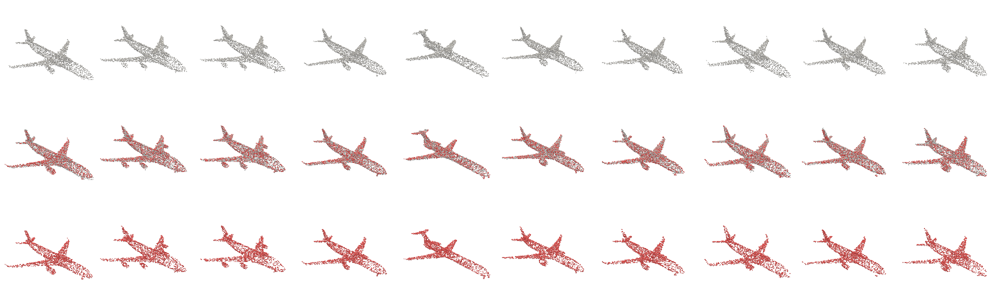

In [30]:
from shapesynthesis.metrics.evaluation import EMD_CD

result = EMD_CD(reconstructed_pc.cuda(),ground_truth_pc.cuda(),reduced=False,accelerated_cd=True,batch_size=100)

_, idxs = torch.topk(result["MMD-EMD"],k=50,largest=False)
idxs = idxs.cpu()
scale = 10
plot_recon_3d(scale*reconstructed_pc[idxs].cpu().numpy(),scale * ground_truth_pc[idxs].cpu().numpy(),num_pc=10)

NOTE: It looks like this is also the mode collapse (compare with the generated samples), Maybe there are a lot of these types of airplanes and it just learned to reconstruct them very well.

# Overlay of the VAE reconstruction. 

Same story but the ect is first passed through the VAE as an autoencoder and then reconstructed with the Encoder.
Results should be worse as the VAE 

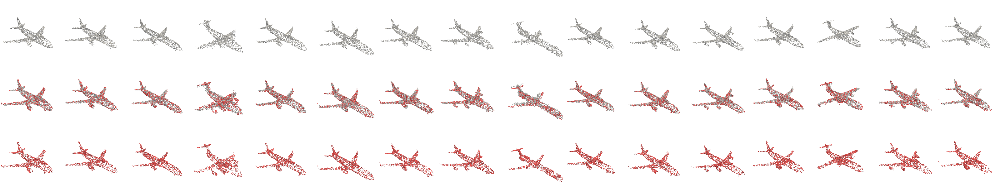

In [31]:
from shapesynthesis.plotting import plot_recon_3d

reconstructed_pc = torch.load("./results/vae_airplane_latent/reconstructions.pt")
ground_truth_pc = torch.load("./results/vae_airplane_latent/references.pt")

plot_recon_3d(reconstructed_pc.cpu().numpy() * 10,ground_truth_pc.cpu().numpy() * 10,num_pc=16,offset=0)

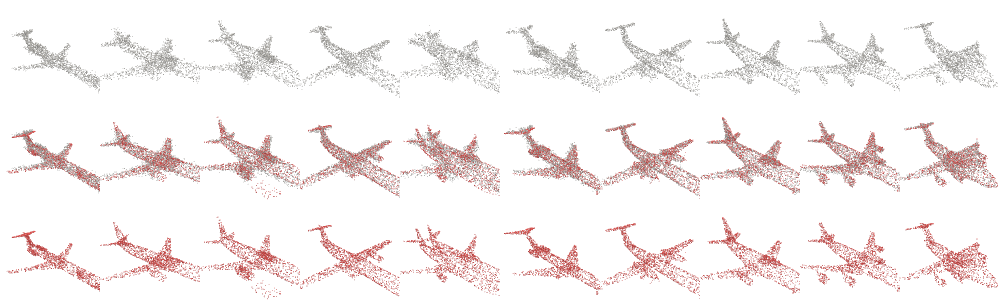

In [38]:
from shapesynthesis.metrics.evaluation import EMD_CD

result = EMD_CD(reconstructed_pc.cuda(),ground_truth_pc.cuda(),reduced=False,accelerated_cd=True,batch_size=100)

_, idxs = torch.topk(result["MMD-EMD"],k=50,largest=True)
idxs = idxs.cpu()
scale = 5
plot_recon_3d(scale*reconstructed_pc[idxs].cpu().numpy(),scale * ground_truth_pc[idxs].cpu().numpy(),num_pc=10)

In particular number 9 is an interesting one, since it involves an airplane that is slightly rotated along the z-axis.

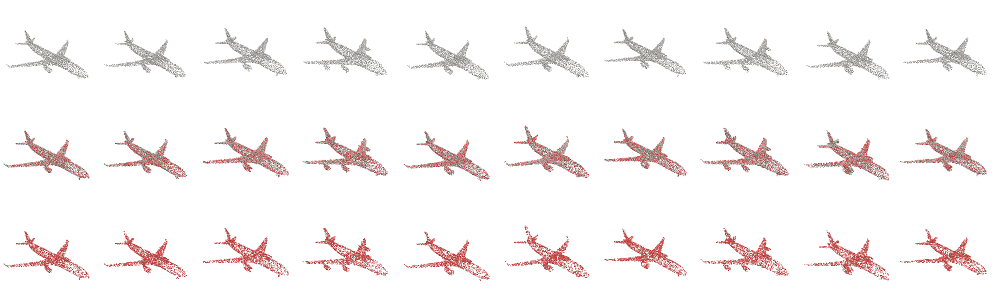

In [33]:
from shapesynthesis.metrics.evaluation import EMD_CD

result = EMD_CD(reconstructed_pc.cuda(),ground_truth_pc.cuda(),reduced=False,accelerated_cd=True,batch_size=100)

_, idxs = torch.topk(result["MMD-EMD"],k=50,largest=False)
idxs = idxs.cpu()
scale = 10
plot_recon_3d(scale*reconstructed_pc[idxs].cpu().numpy(),scale * ground_truth_pc[idxs].cpu().numpy(),num_pc=10)

# Normalized airplane

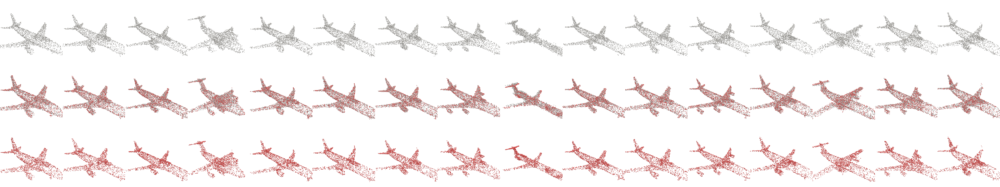

In [34]:
from shapesynthesis.plotting import plot_recon_3d

reconstructed_pc = torch.load("./results/encoder_airplane_normalized/reconstructions.pt")
ground_truth_pc = torch.load("./results/encoder_airplane_normalized/references.pt")


plot_recon_3d(reconstructed_pc.cpu().numpy() * 5,ground_truth_pc.cpu().numpy() * 5,num_pc=16,offset=0)

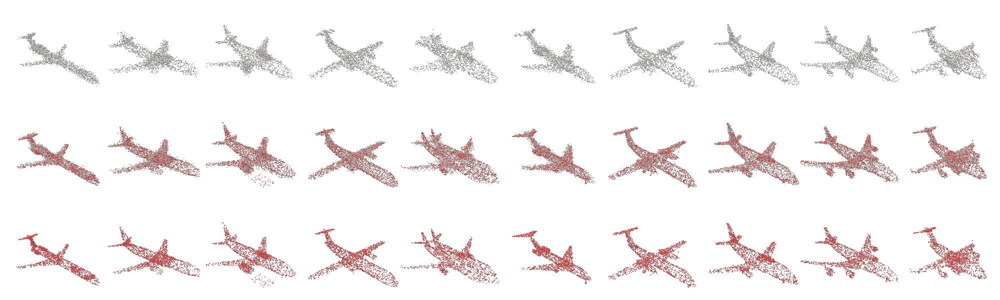

In [35]:
from shapesynthesis.metrics.evaluation import EMD_CD

result = EMD_CD(reconstructed_pc.cuda(),ground_truth_pc.cuda(),reduced=False,accelerated_cd=True,batch_size=100)

_, idxs = torch.topk(result["MMD-EMD"],k=50,largest=True)
idxs = idxs.cpu()
scale = 4
plot_recon_3d(scale*reconstructed_pc[idxs].cpu().numpy(),scale * ground_truth_pc[idxs].cpu().numpy(),num_pc=10)

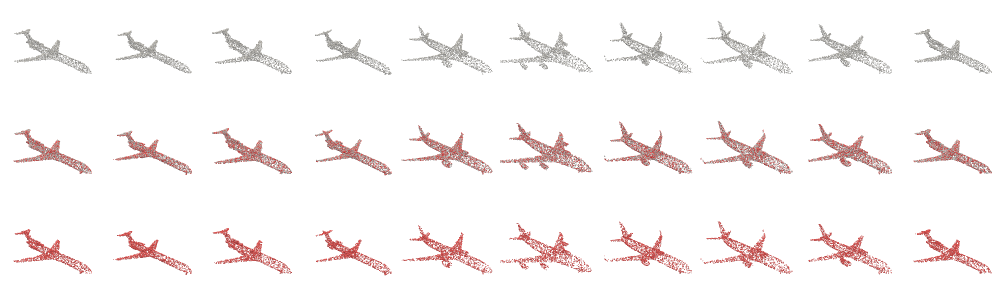

In [36]:
from shapesynthesis.metrics.evaluation import EMD_CD

result = EMD_CD(reconstructed_pc.cuda(),ground_truth_pc.cuda(),reduced=False,accelerated_cd=True,batch_size=100)

_, idxs = torch.topk(result["MMD-EMD"],k=50,largest=False)
idxs = idxs.cpu()
scale = 4
plot_recon_3d(scale*reconstructed_pc[idxs].cpu().numpy(),scale * ground_truth_pc[idxs].cpu().numpy(),num_pc=10)